In [1]:
!pip uninstall -y mediapipe
!pip install mediapipe==0.10.11



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 41.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.1/162.1 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 105.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.8 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found

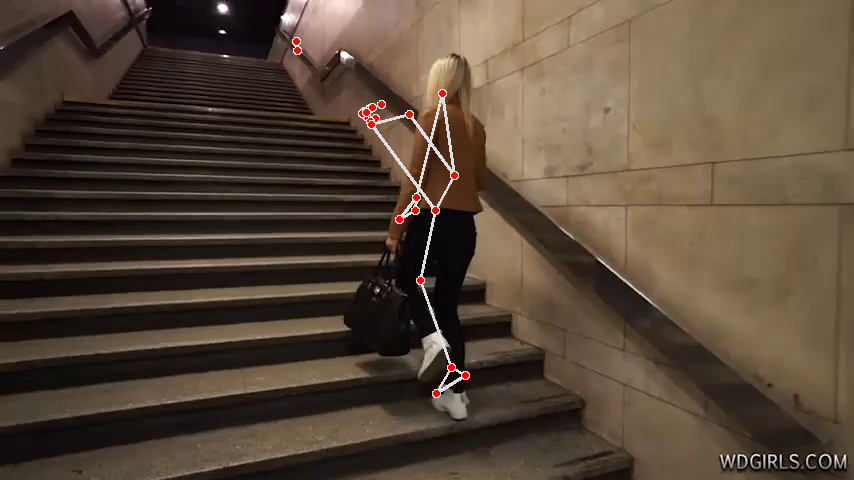

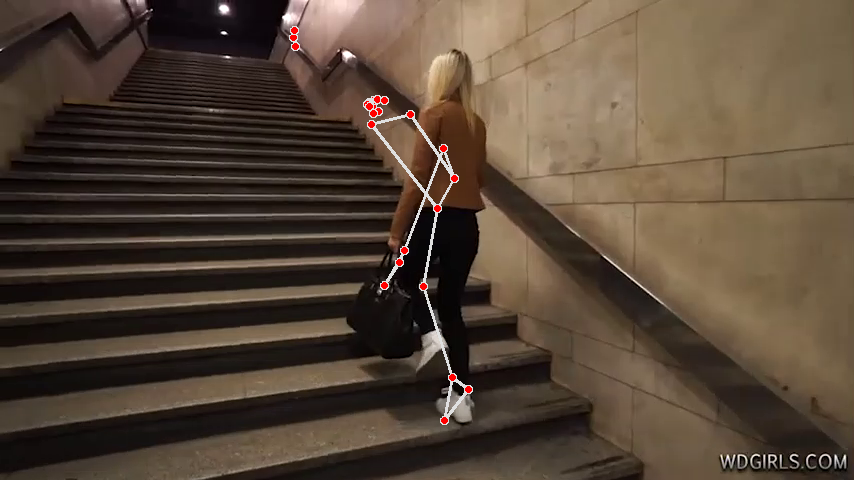

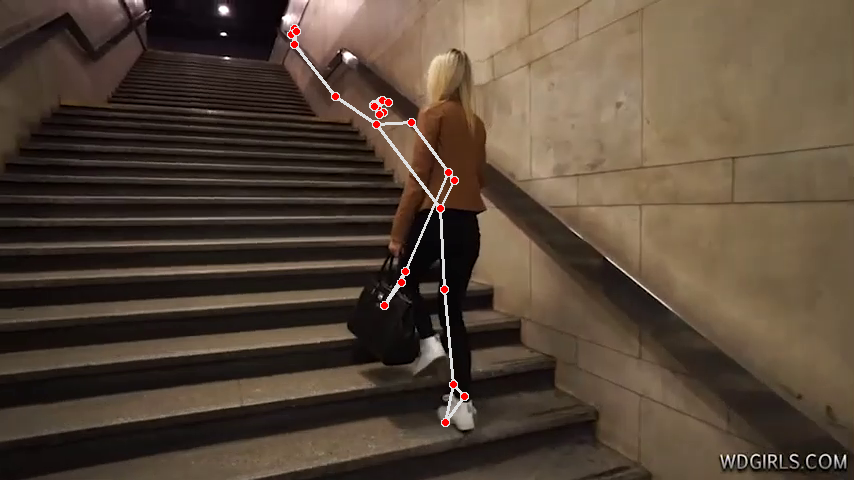

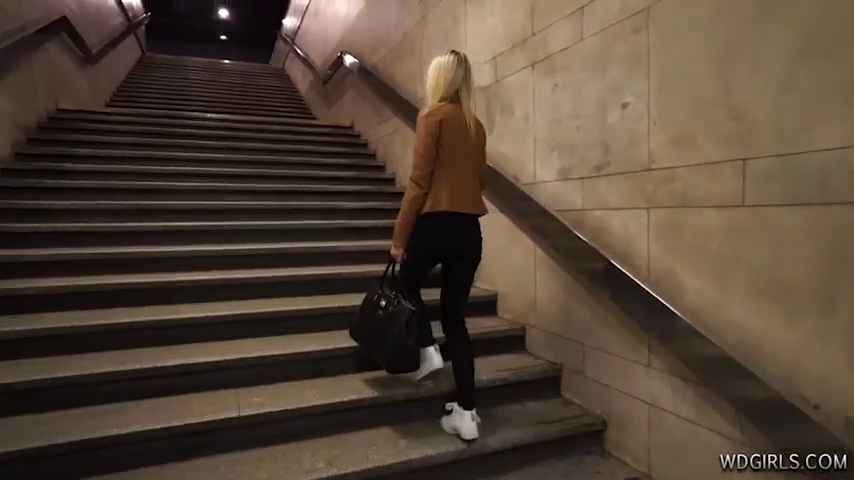

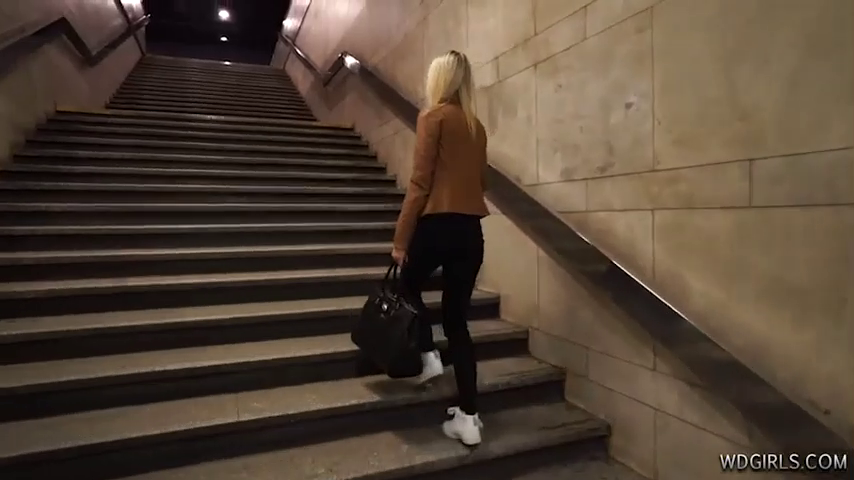

...

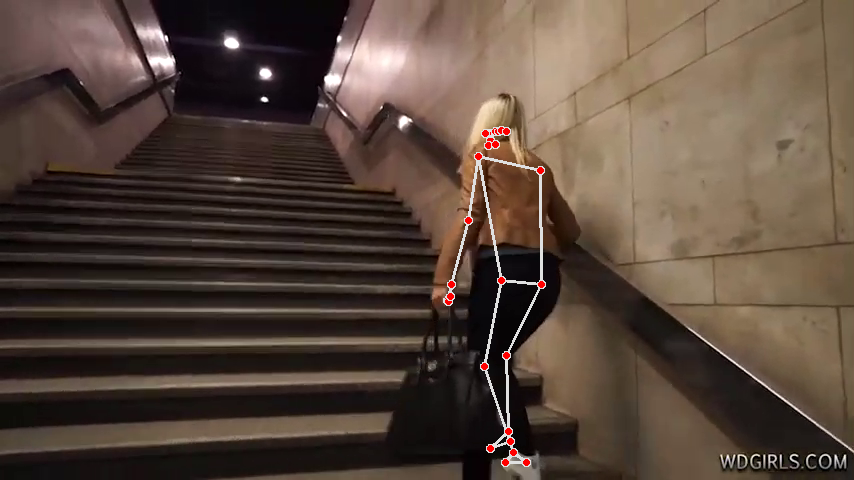

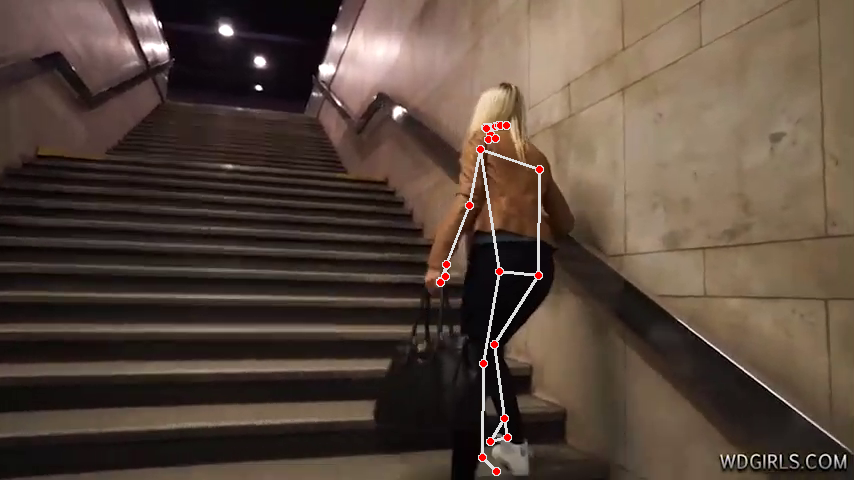

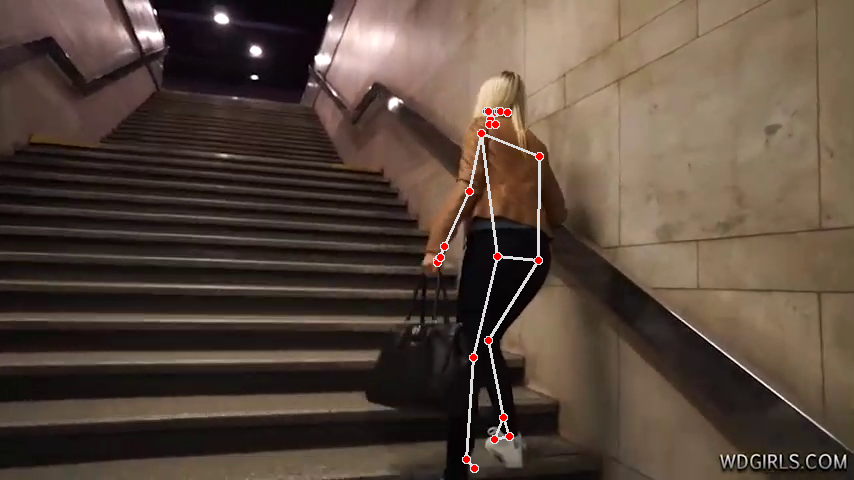

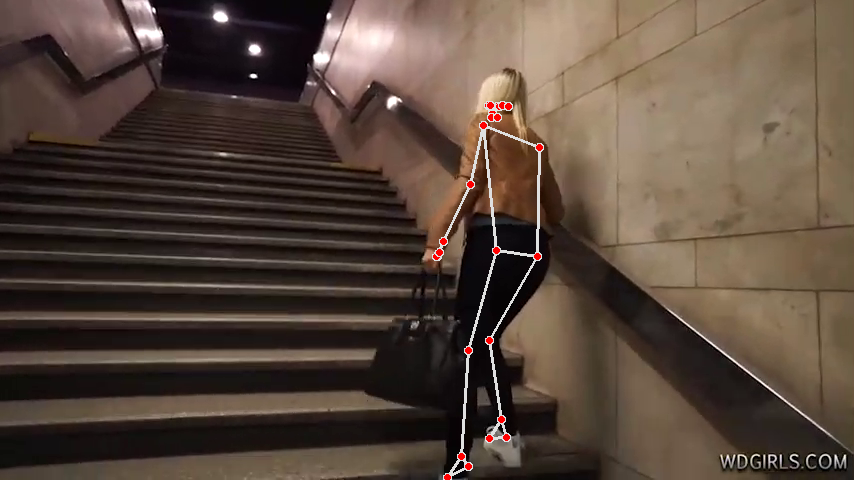

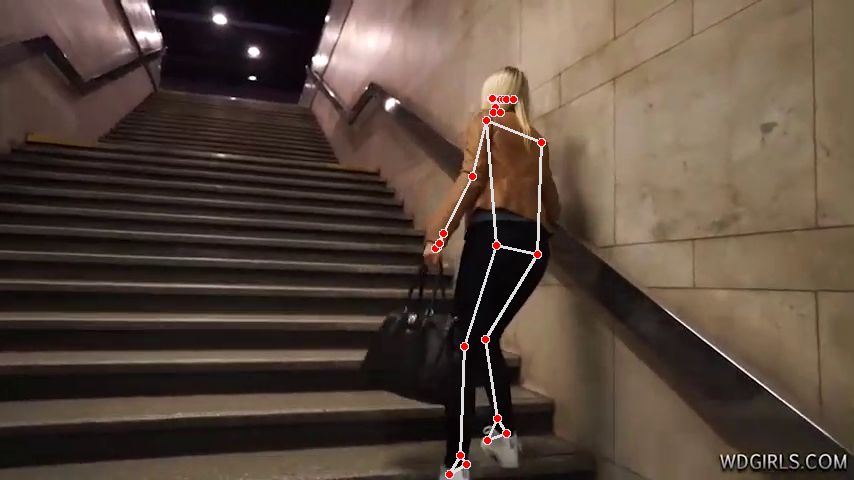

In [1]:
import cv2
import numpy as nр
import mediapipe as mp
import time
from google.colab.patches import cv2_imshow




#Initialize MediaPipe Pose

mp_pose = mp.solutions.pose
pose = mp_pose.Pose()


def mediapipe_detection(image, model):
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # COLOR CONVERSION BGR 2 RGB
  image.flags.writeable = False # Image is no Longer writeable
  results = model.process(image) #Make prediction
  image.flags.writeable = True # Image is now writeable
  image = cv2.cvtColor (image, cv2.COLOR_RGB2BGR) # COLOR CONVERSION RGB 2 BGR
  return image, results

def draw_landmarks(image, results):
  mp.solutions.drawing_utils.draw_landmarks(image, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)


# Path to the input video
video_path = '/content/drive/MyDrive/Colab Notebooks/DATASET/train/intoxicated/video2.mp4'

# Open the video
cap = cv2.VideoCapture(video_path)

frame_count = 0

while cap. isOpened():
  ret, frame = cap.read()
  if not ret or frame_count > 30:
    break

  # Make detections
  image, results = mediapipe_detection(frame, pose)

  # Draw Landmarks
  draw_landmarks(image, results)

  # Display the frame with Landmarks
  cv2_imshow(image)

  time.sleep(0.2)

  frame_count += 1


cap.release()


In [2]:
import os
import cv2
import numpy as np
import mediapipe as mp


# Initialisation of MediaPipe Pose
mp_pose = mp.solutions.pose
pose = mp_pose.Pose()
mp_drawing = mp.solutions.drawing_utils


actions = ['sober', 'intoxicated', 'heavily_intoxicated']
DATA_PATH = '/content/drive/MyDrive/Colab Notebooks/DATASET/keypoints'



SEQUENCE_LENGTH = 30

# Detection with MediaPipe
def mediapipe_detection(image, model):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image.flags.writeable = False
    results = model.process(image)
    image.flags.writeable = True
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    return image, results

# drawing keypoints
def draw_landmarks(image, results):
    if results.pose_landmarks:
        mp_drawing.draw_landmarks(
            image,
            results.pose_landmarks,
            mp_pose.POSE_CONNECTIONS)
    return image

# Extraction of keypoints of the posture
def extract_keypoints(results):
    if results.pose_landmarks:
        return np.array([
            [res.x, res.y, res.z]
            for res in results.pose_landmarks.landmark
        ]).flatten()
    else:
        # If no detection, we return an array of zeros
        return np.zeros(33 * 3)  # 33 keypoints, 3 coordinate (x, y, z)

for action in actions:
    action_dir = f'/content/drive/MyDrive/Colab Notebooks/DATASET/train/{action}'
    for sequence in range(len(os.listdir(action_dir))):
        try:
            os.makedirs(os.path.join(DATA_PATH, action, str(sequence)))
        except FileExistsError:
            pass

# extraction of keypoints in Videos
for action in actions:
    action_dir = f'/content/drive/MyDrive/Colab Notebooks/DATASET/train/{action}'

    for sequence, video in enumerate(os.listdir(action_dir)):
        video_path = os.path.join(action_dir, video)
        cap = cv2.VideoCapture(video_path)
        frame_num = 0

        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
              break

            # Détection with Mediapipe
            image, results = mediapipe_detection(frame, pose)
            draw_landmarks(image, results)

            # extracting keypoints
            keypoints = extract_keypoints(results)
            if keypoints is not None:
                npy_path = os.path.join(DATA_PATH, action, str(sequence), str(frame_num))
                np.save(npy_path, keypoints)
                frame_num += 1

        cap.release()
        print(f"Finished processing video: {video}")

print("All videos processed and data saved.")



Finished processing video: video5.mp4
Finished processing video: video3.mp4
Finished processing video: video2.mp4
Finished processing video: video1.mp4
Finished processing video: video22.mp4
Finished processing video: video7.mp4
Finished processing video: video41.mp4
Finished processing video: video11.mp4
Finished processing video: video18.mp4
Finished processing video: video19.mp4
Finished processing video: video13.mp4
Finished processing video: video14.mp4
Finished processing video: video12.mp4
Finished processing video: video21.mp4
Finished processing video: video6.mp4
Finished processing video: video9.mp4
Finished processing video: video23.mp4
Finished processing video: video17.mp4
Finished processing video: video15.mp4
Finished processing video: video8.mp4
Finished processing video: video10.mp4
Finished processing video: video4.mp4
Finished processing video: video16.mp4
Finished processing video: video20.mp4
Finished processing video: video40.mp4
Finished processing video: video39

In [3]:
pip install tensorflow

In [4]:
import numpy as np
import os
from tensorflow.keras.utils import to_categorical


def load_data(DATA_PATH, actions, SEQUENCE_LENGTH):
  X = []
  y = []
  action_counts = {action: 0 for action in actions}

  for action in actions:
    action_dir = os.path.join(DATA_PATH, action)
    sequences = os.listdir(action_dir)
    for sequence in sequences:
      sequence_path = os.path.join(action_dir, sequence)
      if not os.path.isdir(sequence_path):
        continue
      sequence_data = []
      for frame_num in range(SEQUENCE_LENGTH):
        print(frame_num)
        npy_path = os.path.join(sequence_path, f'{frame_num}.npy')
        if not os.path.exists(npy_path):
          continue
        keypoints = np.load(npy_path)
        sequence_data.append(keypoints)
      if len(sequence_data) == SEQUENCE_LENGTH:
        X.append(sequence_data)
        y.append(actions.index(action))
        action_counts[action] += 1

  for action, count in action_counts.items():
    print(f"Action '{action}' has {count} sequences.")

  return np.array(X), to_categorical(y, num_classes = len(actions))



#Definition of classes (adapted to drunkenness levels)

DATA_SAVE = '/content/drive/MyDrive/Colab Notebooks/DATASET/keypoints'

#Number of images to capture per sequence

SEQUENCE_LENGTH = 25

X, y = load_data(DATA_SAVE, actions, SEQUENCE_LENGTH)

if len(X) == 0:
  print("No complete sequences found. Please check your data.")
  exit()

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train = X_train[..., np.newaxis]
X_test = X_test[..., np.newaxis]

print(f"Shape of X_train: {X_train.shape}")
print(f"Shape pf X_test: {X_test.shape}")

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
0
1
2
3
4
5
6
7
8
9
10
11

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_15      │ (None, 25, 99)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 25, 99)    │        198 │ input_layer_15[0… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 25, 99)    │     25,635 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_84 (Add)        │ (None, 25, 99)    │          0 │ layer_normalizat… │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 25, 99)    │        198 │ add_84[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_129 (Dense)   │ (None, 25, 128)   │     12,800 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_73          │ (None, 25, 128)   │          0 │ dense_129[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_130 (Dense)   │ (None, 25, 99)    │     12,771 │ dropout_73[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_85 (Add)        │ (None, 25, 99)    │          0 │ layer_normalizat… │
│                     │                   │            │ dense_130[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 25, 99)    │        396 │ add_85[0][0]      │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_15 (LSTM)      │ (None, 25, 64)    │     41,984 │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_15          │ (None, 1600)      │          0 │ lstm_15[0][0]     │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_131 (Dense)   │ (None, 128)       │    204,928 │ flatten_15[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_74          │ (None, 128)       │          0 │ dense_131[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_132 (Dense)   │ (None, 64)        │      8,256 │ dropout_74[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_75          │ (None, 64)        │          0 │ dense_132[0][0]   │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_133 (Dense)   │ (None, 3)         │        195 │ dropout_75[0][0]  │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 307,361 (1.17 MB)

 Trainable params: 307,163 (1.17 MB)

 Non-trainable params: 198 (792.00 B)

Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 408ms/step - accuracy: 0.3305 - loss: 1.1743 - val_accuracy: 0.3158 - val_loss: 1.1018 - learning_rate: 0.0010
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step - accuracy: 0.5090 - loss: 1.0249 - val_accuracy: 0.4211 - val_loss: 1.1051 - learning_rate: 0.0010
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - accuracy: 0.5043 - loss: 0.9501 - val_accuracy: 0.4474 - val_loss: 1.1599 - learning_rate: 0.0010
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.5205 - loss: 0.9955 - val_accuracy: 0.4211 - val_loss: 1.1414 - learning_rate: 0.0010
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.5460 - loss: 0.9428 - val_accuracy: 0.3421 - val_loss: 1.1125 - learning_rate: 0.0010
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.5667 - loss: 0.9225 - val_accuracy: 0.5526 - val_loss: 0.9818 - learning_rate: 0.0010
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.6556 - loss: 0.7688 - val_accuracy: 0.

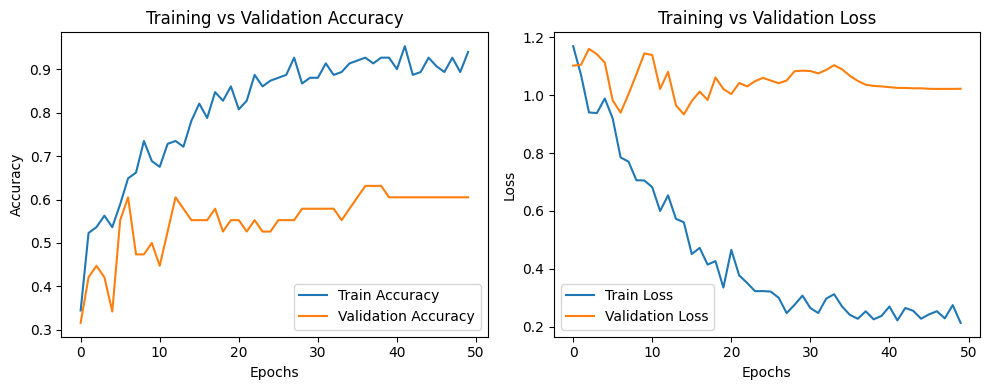

In [24]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.layers import LayerNormalization, MultiHeadAttention, Add
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

# Parameters
input_shape = (25, 99)  # 25 frames, 33 keypoints x,y,z
actions = ['sober', 'intoxicated', 'heavily_intoxicated']


inputs = Input(shape=input_shape)

#transformer with 1 layer
x = LayerNormalization()(inputs)
attn_output = MultiHeadAttention(num_heads=2, key_dim=32)(x, x)
x = Add()([x, attn_output])
x = LayerNormalization()(x)

# Feed Forward
ffn = Dense(128, activation='relu')(x)
ffn = Dropout(0.3)(ffn)
ffn = Dense(99)(ffn)
x = Add()([x, ffn])
x = BatchNormalization()(x)

# Bloc LSTM + Dense
x = LSTM(64, return_sequences=True)(x)
x = Flatten()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(64, activation='relu')(x)
x = Dropout(0.3)(x)
outputs = Dense(len(actions), activation='softmax')(x)

# Compilation
model = Model(inputs, outputs)
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

#Callback for adjusting learning rate
lr_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1, min_lr=1e-6)

# training
history = model.fit(X_train, y_train,
                    validation_data=(X_test, y_test),
                    batch_size=32,
                    epochs=50,
                    callbacks=[lr_callback])

# Evaluation
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

# Visualization
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training vs Validation Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()




In [25]:
model.save('intoxication_level3.h5')

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 443ms/step


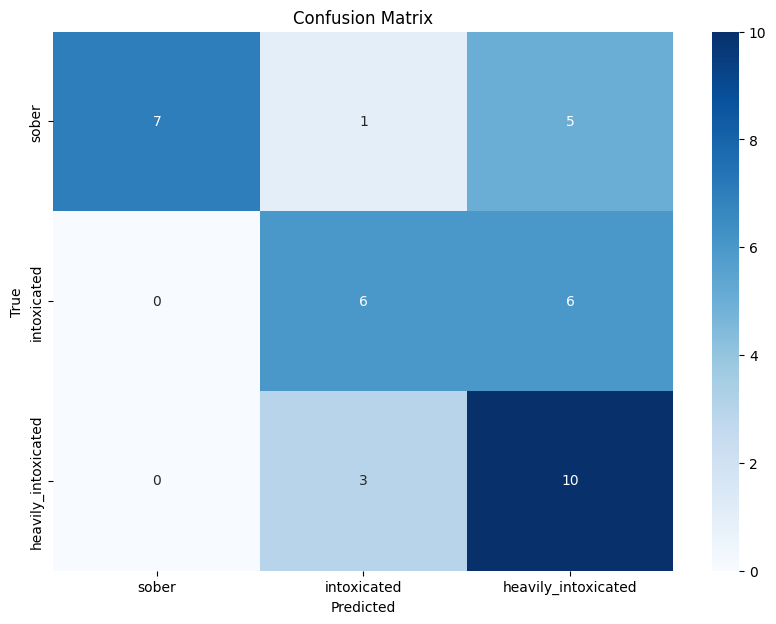

Classification Report:
                     precision    recall  f1-score   support

              sober       1.00      0.54      0.70        13
        intoxicated       0.60      0.50      0.55        12
heavily_intoxicated       0.48      0.77      0.59        13

           accuracy                           0.61        38
          macro avg       0.69      0.60      0.61        38
       weighted avg       0.69      0.61      0.61        38



In [26]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Make predictions
y_pred = model.predict(X_test)

# Convert predictions and actual Labels to class indices
y_pred_classes = np.argmax(y_pred, axis=1)
y_test_classes = np.argmax(y_test, axis=1)

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)

# Display the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', xticklabels=actions, yticklabels=actions, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Print classification report
print("Classification Report:")
print(classification_report(y_test_classes, y_pred_classes, target_names=actions))






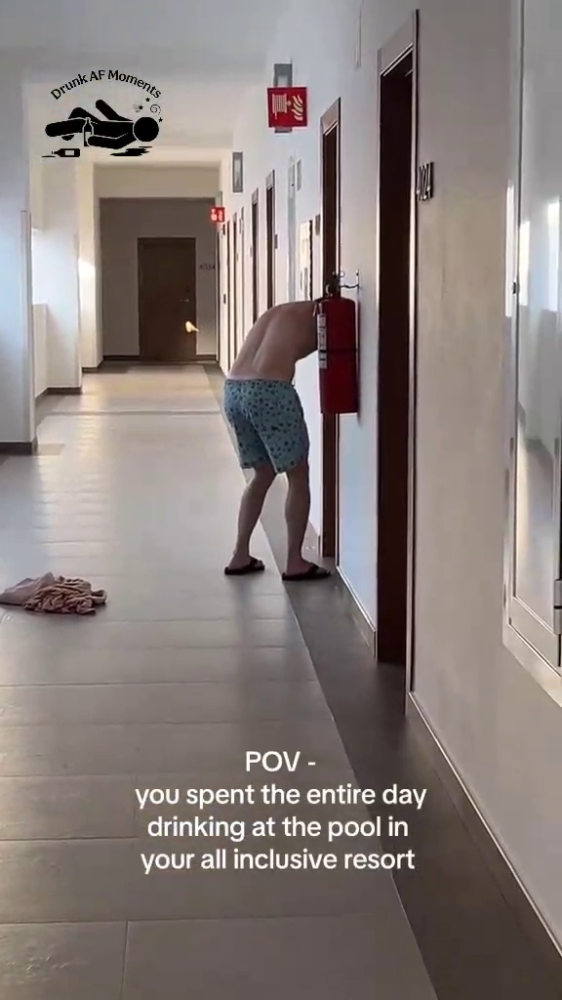

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step

✅ final prediction: **HEAVILY_INTOXICATED**


In [29]:
import cv2
import numpy as np
import mediapipe as mp
from tensorflow.keras.models import load_model
from IPython.display import display, clear_output
from PIL import Image
import time

# Charge the model
model_action_recognition = load_model('/content/intoxication_level3.h5')


actions = ['sober', 'intoxicated', 'heavily_intoxicated']
sequence_length = 25

# Initialize MediaPipe Pose
mp_pose = mp.solutions.pose
pose = mp_pose.Pose()

def mediapipe_detection(image):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    results = pose.process(image_rgb)
    return results

def extract_keypoints(results):
    if results.pose_landmarks:
        return np.array([[res.x, res.y, res.z] for res in results.pose_landmarks.landmark]).flatten()
    else:
        return None

# Charge the video
input_video_path = '/content/drive/MyDrive/Colab Notebooks/DATASET/test/video3.mp4'
cap = cv2.VideoCapture(input_video_path)

all_keypoints = []
frame_skip = 2
frame_count = 0

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame_count += 1
    if frame_count % frame_skip != 0:
        continue

    # Show in Google Colab
    display_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    clear_output(wait=True)
    display(Image.fromarray(display_frame))
    time.sleep(0.03)

    # Treatment
    results = mediapipe_detection(frame)
    keypoints = extract_keypoints(results)
    if keypoints is not None:
        all_keypoints.append(keypoints)

cap.release()

# prepare the sequence for the model
if len(all_keypoints) < sequence_length:
    padding = [np.zeros_like(all_keypoints[0]) for _ in range(sequence_length - len(all_keypoints))]
    all_keypoints.extend(padding)
else:
    all_keypoints = all_keypoints[-sequence_length:]

sequence = np.array(all_keypoints)

# unique prediction
prediction = model_action_recognition.predict(np.expand_dims(sequence, axis=0))[0]
predicted_label = actions[np.argmax(prediction)]

print(f"\n✅ final prediction: **{predicted_label.upper()}**")









